In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
from itertools import combinations
from scipy.spatial import ConvexHull
import json, pickle

In [2]:
def transform_points(p1, p2):
    x = (p1[0],p2[0])
    y = (p1[1],p2[1])
    return x, y

def circle(center, radius):
    theta = np.linspace(-np.pi, np.pi, 100)
    xc, yc = center
    x = xc + radius * np.cos(theta)
    y = yc + radius * np.sin(theta)
    return x, y

def line_intersection(line1, line2):
    xdiff = (line1[0][0] - line1[1][0], line2[0][0] - line2[1][0])
    ydiff = (line1[0][1] - line1[1][1], line2[0][1] - line2[1][1])

    def det(a, b):
        return a[0] * b[1] - a[1] * b[0]

    div = det(xdiff, ydiff)
    if div == 0:
       raise Exception('lines do not intersect')

    d = (det(*line1), det(*line2))
    x = det(d, xdiff) / div
    y = det(d, ydiff) / div
    return x, y

def midpoint_of_line(p1, p2):
    x1, y1 = p1
    x2, y2 = p2
    mid_x = (x1 + x2) / 2
    mid_y = (y1 + y2) / 2
    center = (mid_x, mid_y)
    return center

def circle_line_intersect(circle_center, circle_radius, line):
    # Line direction vector
    h, k = circle_center

    (x1, y1), (x2, y2) = line

    dx = x2 - x1
    dy = y2 - y1

    # Convert to line equation coefficients: Ax + By + C = 0
    A = dy
    B = -dx
    C = dx * y1 - dy * x1

    # Distance from circle center to the line
    d = abs(A*h + B*k + C) / math.sqrt(A*A + B*B)

    if d < circle_radius:
        return True # "The line intersects the circle (two points)."
    elif d == circle_radius:
        return True # "The line is tangent to the circle (one point)."
    else:
        return False # "The line does not intersect the circle."

def median_combinations(median_segments):
    valid_combs = []
    all_combs = list(combinations(median_segments,2))
    for comb in all_combs:
        l1, l2 = comb
        p1, p2 = l1
        if p1 in l2:
            valid_combs.append(comb)
            continue
        if p2 in l2:
            valid_combs.append(comb)
            continue
    return valid_combs

def comb_to_same_start(comb):
    c1, c2 = comb
    if c1[0] == c2[0]:
        new_comb = comb
    elif c1[0] == c2[1]:
        new_comb = (c1, (c2[1], c2[0]))
    elif c1[1] == c2[0]:
        new_comb = ((c1[1], c1[0]), c2)
    elif c1[1] == c2[1]:
        new_comb = ((c1[1], c1[0]), (c2[1],c2[0]))
    return new_comb

def angle_between_vectors(l1, l2):
    l1, l2 = comb_to_same_start((l1, l2))
    p1, p2 = l1
    p3, p4 = l2
    v1 = np.array([p2[0]-p1[0], p2[1]-p1[1]])
    v2 = np.array([p4[0]-p3[0], p4[1]-p3[1]])
    
    angle = abs(np.arctan2(v1[1], v1[0]) - np.arctan2(v2[1],  v2[0]))
    if angle < np.pi:
        angle_bigger_pi = False # False
    else:
        angle_bigger_pi = True # True
    angle = angle%np.pi
    return angle, angle_bigger_pi

def orthogonal_connection_exists(P, A, B):
    """
    A, B, P are 2D points as numpy arrays, e.g. np.array([x, y])
    Returns True if the perpendicular projection of P onto AB
    lies within the segment AB.
    """

    A = np.array(A)
    B = np.array(B)

    AB = B - A
    AP = P - A

    # Squared length of AB
    AB_len2 = np.dot(AB, AB)
    if AB_len2 == 0:
        return False  # A and B are the same point

    # Projection parameter t
    t = np.dot(AP, AB) / AB_len2

    # Check if projection lies on the segment
    return 0 <= t <= 1

def side_of_segment(p, a, b, only_in_bounds=True):
    """
    Classifies point p relative to the directed segment a→b.

    Returns:
        "left"         → p is left of the segment
        "right"        → p is right of the segment
        "on"           → p lies exactly on the segment line
        "out_of_bounds"→ perpendicular projection is not between a and b
    """
    # Vector ab and ap
    AB = (b[0] - a[0], b[1] - a[1])
    AP = (p[0] - a[0], p[1] - a[1])

    if only_in_bounds:
        in_bounds = orthogonal_connection_exists(p, a, b)
        if not in_bounds:
            return "out_of_bounds"

    # Cross product to determine left/right/on
    cross = AB[0]*AP[1] - AB[1]*AP[0]
    
    if cross > 0:
        return "left"
    elif cross < 0:
        return "right"
    else:
        return "on"

def get_median_lines(points, only_in_bounds=True):
    majority = len(points)//2 + 1

    median_lines = []

    point_combs = list(combinations(points,2))
    for pc in point_combs: 
        right_counter = 0
        left_counter = 0
        for p in points:
            if p in pc:
                continue
            s = side_of_segment(p, *pc, only_in_bounds=only_in_bounds)
            if s == "left":
                left_counter += 1
            elif s == "right":
                right_counter += 1
            elif s == "on":
                left_counter += 1
                right_counter += 1
        left_counter += 2
        right_counter += 2
        if left_counter >= majority and right_counter >= majority:
            median_lines.append(pc)
    return median_lines

def yolk(points, accuracy=0.1, start_yolk_radius=100000, start_yolk_center=[]):
    median_lines = get_median_lines(points, only_in_bounds=False)
    # Check if all median lines share a point.
    potential_common = median_lines[0][0]
    potential_common_sum = sum([True for l in median_lines if potential_common in l])
    if potential_common_sum == len(median_lines):
        yolk_center, yolk_radius = potential_common, 0
        return yolk_center, yolk_radius
    else:
        potential_common = median_lines[0][1]
        potential_common_sum = sum([True for l in median_lines if potential_common in l])
        if potential_common_sum == len(median_lines):
            yolk_center, yolk_radius = potential_common, 0
            return yolk_center, yolk_radius

    # Bin mir immer noch unsicher welche median combinations ausreichend sind. 4 ist recht willkürlich gewählt.
    mcombs = median_combinations(median_lines)
    if True: #len(mcombs) < 4:
        new_lines = []
        all_mcombs = list(combinations(median_lines,2))
        for l1, l2 in all_mcombs:
            try:
                comb_to_same_start((l1, l2))
            except:
                intersect = line_intersection(l1,l2)
                new_lines.append((intersect, l1[0]))
                new_lines.append((intersect, l2[0]))
                new_lines.append((intersect, l1[1]))
                new_lines.append((intersect, l2[1]))
        mcombs = list(combinations(new_lines, 2)) + mcombs

    points_comb = list(combinations(np.array(points),2))
    dists = [np.linalg.norm(pc[0]-pc[1]) for pc in points_comb]
    max_dist = max(dists)
    dists_to_check = np.arange(accuracy, max_dist, accuracy)

    yolk_radius = start_yolk_radius
    yolk_center = start_yolk_center
    for comb in mcombs:
        try:
            comb = comb_to_same_start(comb)
        except:
            continue

        angle, angle_bigger_pi = angle_between_vectors(*comb)

        c1, c2 = comb
        c1 = np.array(c1) 
        c2 = np.array(c2)
        r1 = np.array([c1[1]-c1[0],c1[1]-c1[0]]) 
        r2 = np.array([c2[1]-c2[0],c2[1]-c2[0]])

        angle_vector = 1/2 * (r1/np.linalg.norm(r1) + r2/np.linalg.norm(r2))
        angle_vector = angle_vector/np.linalg.norm(angle_vector)
        
        median_lines_to_cross = [ml for ml in median_lines if ml not in comb]

        for n, distance in enumerate(dists_to_check):
            circle_center = (c1[0] + distance * angle_vector)[0]
            if not angle_bigger_pi:
                circle_radius = np.sin(angle/2) * distance * 1/np.sqrt(2) # sin
            else:
                circle_radius = np.cos(angle/2) * distance * 1/np.sqrt(2) # cos
            intersections_check = [circle_line_intersect(circle_center, circle_radius, ml) for ml in median_lines_to_cross]
            if sum(intersections_check) == len(median_lines_to_cross):
                if circle_radius < yolk_radius:
                    yolk_radius = circle_radius
                    yolk_center = circle_center     
    return yolk_center, yolk_radius

def calculate_yolk(points, accuracy=0.1):
    points = list(dict.fromkeys(points)) # delete duplicate points    
    
    ### Check points is just one single point.
    if len(points) == 1:
        yolk_center = points[0]
        yolk_radius = 0
        return yolk_center, yolk_radius
    
    ### Check if points vary in 1D only.
    x = [p[0] for p in points]
    y = [p[1] for p in points]
    if len(set(x)) <= 1:
        yolk_center = (x[0], np.mean(y))
        yolk_radius = 0
        return yolk_center, yolk_radius
    if len(set(y)) <= 1:
        yolk_center = (np.mean(x), y[0])
        yolk_radius = 0
        return yolk_center, yolk_radius

    if len(points) == 2:
        yolk_center, yolk_radius = midpoint_of_line(points[0], points[1]), 0
    elif len(points) > 2:
        start_yolk_radius = 1000000
        start_yolk_center = []
        yolk_center, yolk_radius = yolk(points, accuracy=accuracy, start_yolk_radius=start_yolk_radius, start_yolk_center=start_yolk_center)
        if yolk_radius == start_yolk_radius:
            print("Starting approximation...")
            outer_points = [points[i] for i in ConvexHull(points).vertices]
            inner_points = [p for p in points if p not in outer_points]
            for i in range(1,len(inner_points)+1):
                points_to_delete = inner_points[:i]
                reduced_points = [p for p in points if p not in points_to_delete]
                yolk_center, yolk_radius = yolk(reduced_points, accuracy=accuracy, start_yolk_radius=start_yolk_radius, start_yolk_center=start_yolk_center)
                if yolk_radius != start_yolk_radius:
                    break
    else:
        yolk_center, yolk_radius = [], 0

    return yolk_center, yolk_radius

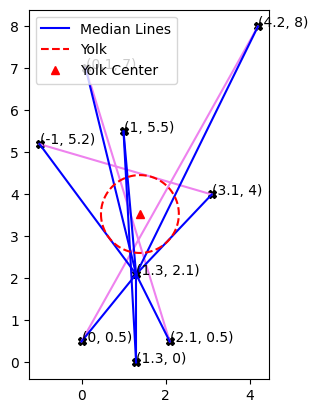

In [3]:
points = [(0,0.5),(1.3,2.1),(2.1,0.5),(1.3,0),(-1,5.2),(1,5.5),(3.1,4),(0.1,7),(4.2,8)]

yolk_center, yolk_radius = calculate_yolk(points, accuracy=0.01)

plot = True
colorblind = False
if plot:
    if colorblind:
        median_color = "black"
        segment_color = "black"
        yolk_color = "black"
    else:
        median_color = "blue"
        segment_color = "violet"
        yolk_color = "red"

    median_segments = get_median_lines(points)
    median_lines = get_median_lines(points, only_in_bounds=False)
    median_lines = [ml for ml in median_lines if ml not in median_segments]

    fig, ax = plt.subplots()

    for p in points:
        ax.plot(p[0],p[1], color="black", marker="X")
        ax.annotate(str(p), p)

    for n, m in enumerate(median_segments):
        x, y = transform_points(*m)
        if n == len(median_lines)-1:
            ax.plot(x, y, color=segment_color, label="Median Lines")
        else:
            ax.plot(x, y, color=segment_color)
    
    for n, m in enumerate(median_lines):
        x, y = transform_points(*m)
        if n == len(median_lines)-1:
            ax.plot(x, y, color=median_color, label="Median Lines")
        else:
            ax.plot(x, y, color=median_color)

    if yolk_radius != 0:
        x, y = circle(yolk_center, yolk_radius)
        ax.plot(x,y, label="Yolk", color=yolk_color, linestyle="dashed")

    if len(yolk_center) != 0:
        ax.plot(yolk_center[0], yolk_center[1], "^", color=yolk_color, label="Yolk Center")

    ax.legend(loc="best")
    ax.set_aspect("equal")
    plt.show()

### Now with real data

In [3]:
def choose_cases(dataframe,column_name,cases):
    snippet = dataframe.loc[dataframe[column_name].isin(cases)]
    
    not_found = np.array([])
    for i in cases:
        if i not in np.array(dataframe[column_name]):
            not_found = np.append(not_found,i)
    not_found = np.sort(not_found)
    if len(not_found) == 0:
        print('every case found')
    else:
        print('cases not found:', not_found)
    return snippet

def find_columns_of_values(dataframe,*values):
    correct_columns = np.array([])
    columns = dataframe.columns
    for val in values:
        val_check = 0
        argument_array = np.array([])
        for c in columns:
            column = np.array(dataframe[c])
            if val in column:
                val_check += 1
                correct_columns = np.append(correct_columns,c)
                argument_array = np.append(argument_array, c)
            elif val_check > 1 and c == columns[-1]:
                print(f'Caution: Argument {val} found in several columns: ', argument_array)
            elif val_check == 0 and c == columns[-1]:
                print(f'Caution: Argument {val} not found in data')
            else:
                continue
    return correct_columns

def group_it(dataframe,arguments,columns,*column_names):
    if len(arguments) == 0:
        snippet = dataframe
    elif len(column_names) != 0:
        data_copy = dataframe.copy()
        for c, arg in zip(column_names,arguments):
            groups = data_copy.groupby(c)
            arg_type = type(arg)
            column_as_array = np.array(data_copy[c]).astype(arg_type).flatten()
            if arg in column_as_array:
                snippet = groups.get_group(arg)
                data_copy = snippet
            else:
                print(f'Caution: Argument {arg} not found in column {c}')
                snip = []
                return snip
    else:
        correct_columns = find_columns_of_values(dataframe,*arguments)
        if len(correct_columns) == 0:
            snip = []
            return snip
        data_copy = dataframe.copy()
        for c, arg in zip(correct_columns,arguments):
            groups = data_copy.groupby(c)
            snippet = groups.get_group(arg)
            data_copy = snippet

    if len(columns) == 0:
        snip = snippet
    else:
        snip = snippet.loc[:,[*columns]]

    return snip

In [4]:
manifesto_path = 'data/manifesto/MPDataset_MPDS2025a_stata14.dta'
manifesto = pd.read_stata(manifesto_path,convert_categoricals=False, convert_missing=False)

paged_path = 'data/paged/PAGED-basic.csv'
paged = pd.read_csv(paged_path)

paged_party_path = 'data/paged/REPDEM-Basic-party-dataset.csv'
paged_party = pd.read_csv(paged_party_path)

cases = ["Austria", "Belgium", "Denmark", "Finland", "France", "Germany", "Greece", "Iceland", "Ireland", "Italy", "Luxembourg", "Netherlands", "Norway", "Portugal", "Spain", "Sweden", "Switzerland", "United Kingdom"]

manifesto_case_selection = choose_cases(manifesto, "countryname", cases=cases)
paged_case_selection = choose_cases(paged, "country_name", cases=cases)

state_variables = ["per401", "per402", "per407", "per410", "per414", "per505", "per507", "per702"]
market_variables = ["per403", "per404", "per405", "per406", "per409", "per412", "per413", "per415", "per504", "per506", "per701"]

progressive_variables = ["per601", "per603", "per605", "per608", "per704"]
conservative_variables = ["per201", "per202", "per503", "per602", "per604" , "per607"]

every case found
cases not found: ['Switzerland']


In [6]:
parliament_bib = {}

for index, row in paged_case_selection.iterrows():
    country = row.country_name
    election_date = pd.to_datetime(row.elecdate)
    
    enp = row.enpp
    polarization_rile = row.parl_polar_rile
    polarization_prosser = row.parl_polar_prosser
    bicam = row.inst_bicam
    pos_parl = row.inst_posparl
    seat_share_lp = row.largest_party_share

    minority_cab = row.cab_minority
    minority_formal = row.cab_formal_minority
    cab_date_in = pd.to_datetime(row.date_in)
    cab_date_out = pd.to_datetime(row.date_out)

    args = [country, election_date]
    cols = []
    column_names = ["countryname", "edate"]
    manifesto_country_election = group_it(manifesto_case_selection, args, cols, *column_names)

    try:
        member_manifesto_id = [party for party, seatshare in zip(manifesto_country_election.party, manifesto_country_election.absseat) if seatshare > 0]
        member_names = [party for party, seatshare in zip(manifesto_country_election.partyabbrev, manifesto_country_election.absseat) if seatshare > 0]
    except:
        member_manifesto_id = []
        member_names = []

    cabinet_name = row.cab_name
    try:
        cabinet_member = row.cab_composition1.split(",")
        cabinet_member_paged_id = [int(cmid) for cmid in row.cab_composition2.split(",")]
    except AttributeError:
        cabinet_member = []
        cabinet_member_paged_id = []
            
    cabinet_member_manifesto_id = []
    for pid in cabinet_member_paged_id:
        mid = paged_party[paged_party.party_id == pid].manifesto_id.dropna().unique()
        if len(mid) == 1:
            mid = mid[0]
            cabinet_member_manifesto_id.append(mid)
        # If there is no Manifesto ID matching the PAGED ID, -1 is appended.
        elif len(mid) > 1:
            print(f"PAGED ID {pid} has ambigous Manifesto ID: {mid}. Searching for year specific Manifesto ID...")
            mid_found = False
            for id_ in mid:
                if len(manifesto_country_election) != 0:
                    if id_ in manifesto_country_election.party:
                        cabinet_member_manifesto_id.append(id_)
                        mid_found = True
                        print(f"Manifesto ID found.")
                        break
            if not mid_found:
                print(f"Manifesto ID not found.")
                cabinet_member_manifesto_id.append(-1)
        else:
            print(f"PAGED ID {pid} has no Manifesto ID")
            cabinet_member_manifesto_id.append(-1)
    
    if len(manifesto_country_election) == 0:
        cabinet_eco = []
        cabinet_soc = []
        parliament_eco = []
        parliament_soc = []
        eco_soc_cabinet = None
        yolk_center, yolk_radius = [], 0
    else:
        eco = manifesto_country_election[state_variables].sum(axis=1) - manifesto_country_election[market_variables].sum(axis=1)
        eco.index = manifesto_country_election.party
        soc = manifesto_country_election[progressive_variables].sum(axis=1) - manifesto_country_election[conservative_variables].sum(axis=1)
        soc.index = manifesto_country_election.party

        eco = pd.concat([eco, pd.Series({-1:None})])
        soc = pd.concat([soc, pd.Series({-1:None})])
        cabinet_eco = [eco[mid] if mid in eco.index else eco[-1] for mid in cabinet_member_manifesto_id]
        cabinet_soc = [soc[mid] if mid in soc.index else soc[-1] for mid in cabinet_member_manifesto_id]
        parliament_eco = [eco[mid] if mid in eco.index else eco[-1] for mid in member_manifesto_id]
        parliament_soc = [soc[mid] if mid in soc.index else soc[-1] for mid in member_manifesto_id]

        try:
            eco_soc_cabinet = (np.mean(cabinet_eco), np.mean(cabinet_soc))
        except:
            eco_soc_cabinet = None
        
        try:
            points = [(e,s) for e,s in zip(parliament_eco,parliament_soc)]
            yolk_center, yolk_radius = calculate_yolk(points, accuracy=0.1)
        except:
            yolk_center, yolk_radius = [], 0

    parliament_bib[index] = {
        "country": country,
        "election_date": election_date,
        "member":{
            "name": member_names,
            "manifesto_id": member_manifesto_id,
            "stance_eco": parliament_eco,
            "stance_soc": parliament_soc
        },
        "enp": enp,
        "polarization": {
            "rile": polarization_rile,
            "prosser": polarization_prosser
        },
        "bicameralism": bicam,
        "positive_parliamentarism": pos_parl,
        "seat_share_largest_party": seat_share_lp,
        "yolk": {
            "center": yolk_center,
            "radius": yolk_radius
        },
        "cabinet": {
            "name": cabinet_name,
            "date_in": cab_date_in,
            "date_out": cab_date_out,
            "minority_cab": minority_cab,
            "minority_formal": minority_formal,
            "member": cabinet_member,
            "paged_id": cabinet_member_paged_id,
            "manifesto_id": cabinet_member_manifesto_id,
            "stance_eco": cabinet_eco,
            "stance_soc": cabinet_soc,
            "eco_soc_mean": eco_soc_cabinet
        }
        }

with open('parliament_bib.pkl', 'wb') as file:
    pickle.dump(parliament_bib, file)

Caution: Argument 1945-11-25 00:00:00 not found in column edate
PAGED ID 10001 has no Manifesto ID
Caution: Argument 1945-11-25 00:00:00 not found in column edate


/home/til/Documents/python/powi/ma-seminar-vetoplayer/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3824: RuntimeWarning: Mean of empty slice
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/til/Documents/python/powi/ma-seminar-vetoplayer/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:142: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


PAGED ID 20001 has no Manifesto ID
PAGED ID 20001 has no Manifesto ID
Caution: Argument 1949-06-26 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20013 has ambigous Manifesto ID: [21913. 21915.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20009 has ambigous Manifesto ID: [21912. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20013 has ambigous Manifesto ID: [21913. 21915.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20009 has ambigous Manifesto ID: [21912. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20009 has ambigous Manifesto ID: [21912. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20013 has ambigous Manifesto ID: [21913. 21915.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 20017 has ambigous Manifesto ID: [21422. 21423. 21425. 21426.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 20004 has ambigous Manifesto ID: [21321. 21221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_v

Caution: Argument 2022-11-01 00:00:00 not found in column edate
PAGED ID 30020 has no Manifesto ID
PAGED ID 49999 has no Manifesto ID
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 49999 has no Manifesto ID
PAGED ID 49999 has no Manifesto ID
PAGED ID 49999 has no Manifesto ID


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 49999 has no Manifesto ID


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 49999 has no Manifesto ID
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 49999 has no Manifesto ID
PAGED ID 49999 has no Manifesto ID
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1979-03-19 00:00:00 not found in column edate
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
Caution: Argument 1979-03-19 00:00:00 not found in column edate
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
Caution: Argument 1979-03-19 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:233: RuntimeWarning: invalid value encountered in divide
  angle_vector = 1/2 * (r1/np.linalg.norm(r1) + r2/np.linalg.norm(r2))
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:233: RuntimeWarning: invalid value encountered in divide
  angle_vector = 1/2 * (r1/np.linalg.norm(r1) + r2/np.linalg.norm(r2))
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 40001 has ambigous Manifesto ID: [14221. 14223.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 2023-04-02 00:00:00 not found in column edate
Caution: Argument 1958-11-30 00:00:00 not found in column edate
PAGED ID 50010 has ambigous Manifesto ID: [31621. 31625. 31626.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 50009 has ambigous Manifesto ID: [31622. 31624. 31630.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 50008 has ambigous Manifesto ID: [31521. 31522. 31529. 31624.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 50006 has ambigous Manifesto ID: [31421. 31320. 31624. 31230.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
Caution: Argument 1958-11-30 00:00:00 not found in column edate
PAGED ID 50010 has ambigous Manifesto ID: [31621. 31625. 31626.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 50009 has ambigous Manifesto ID: [31622. 31624. 31630.]. Searching for year specific Manifesto ID...
Manifesto ID n

/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 60003 has ambigous Manifesto ID: [41111. 41113.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 60003 has ambigous Manifesto ID: [41111. 41113.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 79999 has no Manifesto ID


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 79999 has no Manifesto ID


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 70006 has ambigous Manifesto ID: [34020. 34212.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 79999 has no Manifesto ID


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 70006 has ambigous Manifesto ID: [34020. 34212.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 70006 has ambigous Manifesto ID: [34020. 34212.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 2023-06-25 00:00:00 not found in column edate
Caution: Argument 1942-10-19 00:00:00 not found in column edate
Caution: Argument 1949-10-24 00:00:00 not found in column edate
Caution: Argument 1949-10-24 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1959-10-26 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1979-12-03 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1944-05-30 00:00:00 not found in column edate
PAGED ID 90005 has no Manifesto ID


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1969-06-18 00:00:00 not found in column edate
PAGED ID 90002 has ambigous Manifesto ID: [53220. 53221.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1976-06-21 00:00:00 not found in column edate
Caution: Argument 1976-06-21 00:00:00 not found in column edate
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100009 has ambigous Manifesto ID: [32320. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100011 has ambigous Manifesto ID: [32330. 32322.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100020 has ambigous Manifesto ID: [32610. 32061.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100022 has ambigous Manifesto ID: [32710. 32629.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100016 has ambigous Manifesto ID: [32610. 32521. 32522. 32530.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 109999 has no Manifesto ID


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100005 has ambigous Manifesto ID: [32110. 32111.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100015 has ambigous Manifesto ID: [32421. 32953.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100002 has ambigous Manifesto ID: [32212. 32213.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100005 has ambigous Manifesto ID: [32110. 32111.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100010 has ambigous Manifesto ID: [32321. 32111.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100041 has no Manifesto ID
PAGED ID 100015 has ambigous Manifesto ID: [32421. 32953.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100002 has ambigous Manifesto ID: [32212. 32213.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100005 has ambigous Manifesto ID: [32110. 32111.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100041 has no Manifesto ID
PAGED ID 100002 has ambigous Manifesto ID: [32212. 32213.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100005 has ambigous Manifesto ID: [32110. 32111.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100015 has ambigous Manifesto ID: [32421. 32953.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100010 has ambigous Manifesto ID: [32321. 32111.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100020 has ambigous Manifesto ID: [32610. 32061.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100022 has ambigous Manifesto ID: [32710. 32629.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100016 has ambigous Manifesto ID: [32610. 32521. 32522. 32530.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100020 has ambigous Manifesto ID: [32610. 32061.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100022 has ambigous Manifesto ID: [32710. 32629.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100016 has ambigous Manifesto ID: [32610. 32521. 32522. 32530.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100045 has no Manifesto ID
PAGED ID 100029 has ambigous Manifesto ID: [32329. 32440.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100001 has ambigous Manifesto I

/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100029 has ambigous Manifesto ID: [32329. 32440.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 100029 has ambigous Manifesto ID: [32329. 32440.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 100020 has ambigous Manifesto ID: [32610. 32061.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 2022-09-25 00:00:00 not found in column edate
PAGED ID 100020 has ambigous Manifesto ID: [32610. 32061.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
Caution: Argument 2018-10-14 00:00:00 not found in column edate
Caution: Argument 2023-10-08 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_v

Caution: Argument 2023-11-22 00:00:00 not found in column edate
PAGED ID 129999 has no Manifesto ID
PAGED ID 120035 has no Manifesto ID


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1965-09-13 00:00:00 not found in column edate
Caution: Argument 1969-09-08 00:00:00 not found in column edate
Caution: Argument 1969-09-08 00:00:00 not found in column edate
Caution: Argument 1969-09-08 00:00:00 not found in column edate
Caution: Argument 1973-09-10 00:00:00 not found in column edate
Caution: Argument 1973-09-10 00:00:00 not found in column edate
Caution: Argument 1977-09-12 00:00:00 not found in column edate
Caution: Argument 1977-09-12 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1985-09-09 00:00:00 not found in column edate
Caution: Argument 1985-09-09 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1997-09-15 00:00:00 not found in column edate
Caution: Argument 1997-09-15 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 2021-09-13 00:00:00 not found in column edate
PAGED ID 140012 has ambigous Manifesto ID: [35520. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 149999 has no Manifesto ID
PAGED ID 149999 has no Manifesto ID
PAGED ID 149999 has no Manifesto ID
PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140012 has ambigous Manifesto ID: [35520. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140012 has ambigous Manifesto ID: [35520. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140012 has ambigous Manifesto ID: [35520. 35060.]. 

/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140012 has ambigous Manifesto ID: [35520. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140012 has ambigous Manifesto ID: [35520. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140012 has ambigous Manifesto ID: [35520. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140012 has ambigous Manifesto ID: [35520. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 2024-03-10 00:00:00 not found in column edate
PAGED ID 140009 has ambigous Manifesto ID: [35313. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 140012 has ambigous Manifesto ID: [35520. 35060.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 150017 has ambigous Manifesto ID: [33430. 33512.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 150017 has ambigous Manifesto ID: [33430. 33512.]. Searching for year specific Manifesto ID...
Manifesto ID not found.
PAGED ID 150017 has ambigous Manifesto ID: [33430. 33512.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_v

PAGED ID 150005 has ambigous Manifesto ID: [33220. 33020. 33320.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 150027 has no Manifesto ID


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1956-09-16 00:00:00 not found in column edate
Caution: Argument 1956-09-16 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


Caution: Argument 1998-09-20 00:00:00 not found in column edate


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


PAGED ID 170007 has ambigous Manifesto ID: [51420. 51421.]. Searching for year specific Manifesto ID...
Manifesto ID not found.


/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_8202/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


In [7]:
with open('parliament_bib.pkl', 'rb') as file:
    golden_bib = pickle.load(file)

In [8]:
golden_bib

{0: {'country': 'Austria',
  'election_date': Timestamp('1945-11-25 00:00:00'),
  'member': {'name': [],
   'manifesto_id': [],
   'stance_eco': [],
   'stance_soc': []},
  'enp': 2.0914957,
  'polarization': {'rile': nan, 'prosser': nan},
  'bicameralism': 1,
  'positive_parliamentarism': 0,
  'seat_share_largest_party': 0.51515152,
  'yolk': {'center': [], 'radius': 0},
  'cabinet': {'name': 'Figl I',
   'date_in': Timestamp('1945-12-20 00:00:00'),
   'date_out': Timestamp('1947-11-20 00:00:00'),
   'minority_cab': 0.0,
   'minority_formal': 0.0,
   'member': ['ÖVP', ' SPÖ', ' KPÖ'],
   'paged_id': [10005, 10004, 10001],
   'manifesto_id': [np.float64(42520.0), np.float64(42320.0), -1],
   'stance_eco': [],
   'stance_soc': [],
   'eco_soc_mean': None}},
 1: {'country': 'Austria',
  'election_date': Timestamp('1945-11-25 00:00:00'),
  'member': {'name': [],
   'manifesto_id': [],
   'stance_eco': [],
   'stance_soc': []},
  'enp': 2.0914957,
  'polarization': {'rile': nan, 'prosser':

In [54]:
keys_to_delete = []

for key in parliament_bib.keys():
    eco = parliament_bib[key]["member"]["stance_eco"]
    if len(eco) == 0:
        keys_to_delete.append(key)
        continue
    if pd.isna(eco).any():
        keys_to_delete.append(key)

new_parliament_bib = {k: v for k, v in parliament_bib.items() if k not in keys_to_delete}

/tmp/ipykernel_5808/170214304.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()
/tmp/ipykernel_5808/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)
/tmp/ipykernel_5808/2542438693.py:233: RuntimeWarning: invalid value encountered in divide
  angle_vector = 1/2 * (r1/np.linalg.norm(r1) + r2/np.linalg.norm(r2))


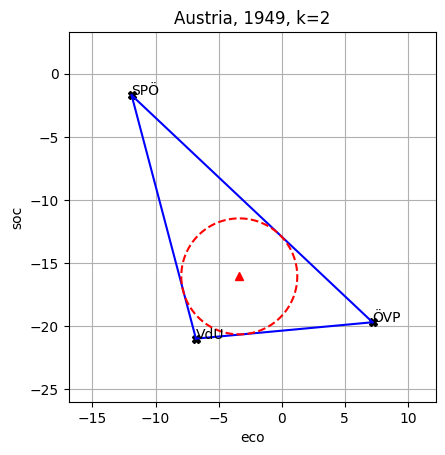

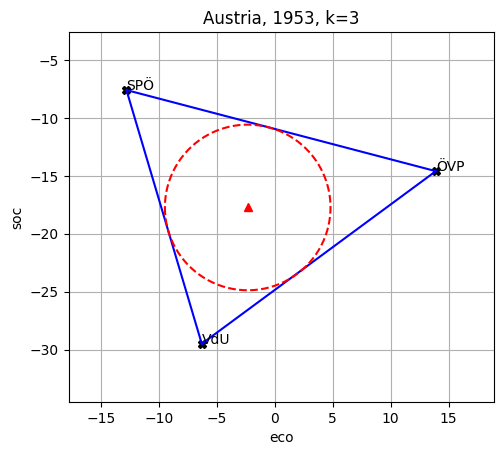

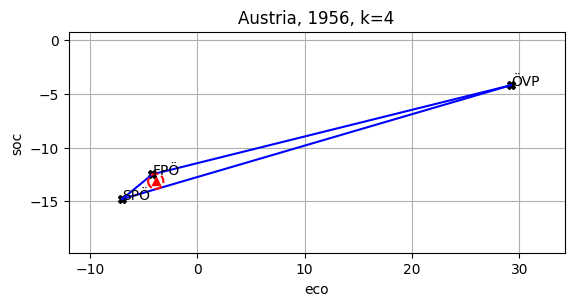

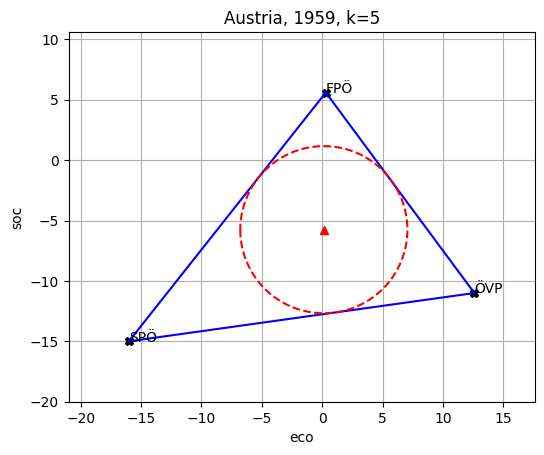

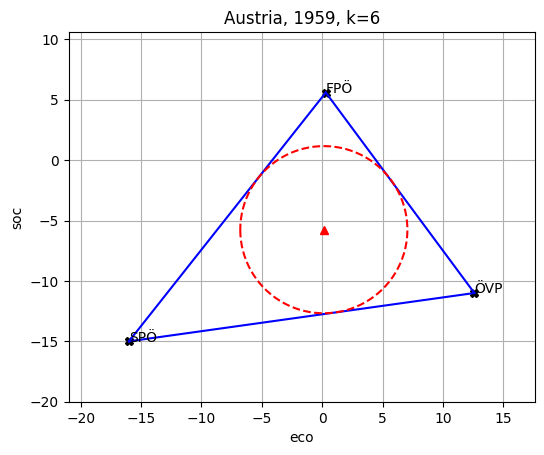

...

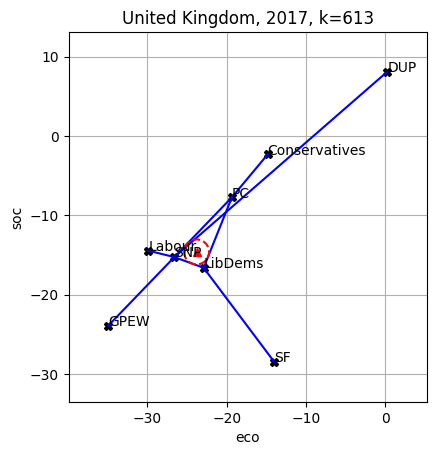

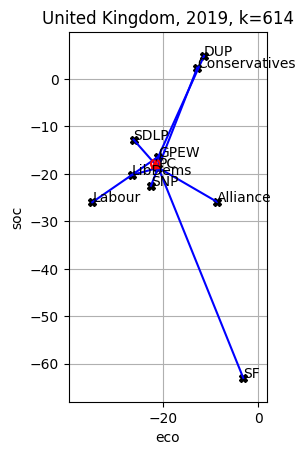

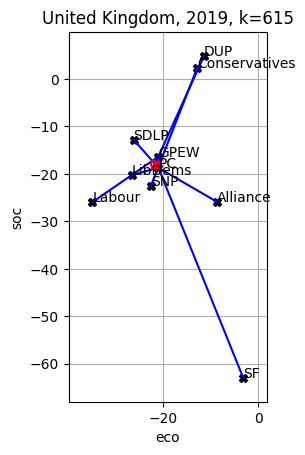

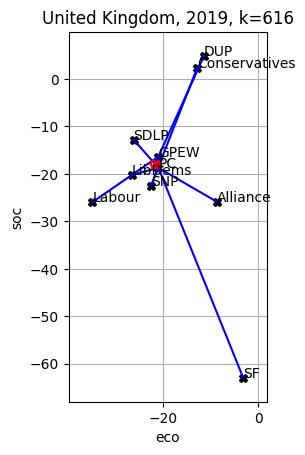

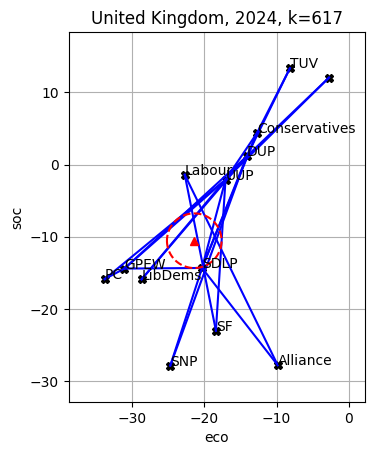

In [32]:
last_country = ""
last_elec_year = ""
for n, k in enumerate(new_parliament_bib.keys()):
    # print(f"{n+1}/{len(new_parliament_bib.keys())} ({round(n/len(new_parliament_bib.keys())* 100, 2)})")
    parliament = new_parliament_bib[k]

    country = parliament["country"]
    elec_year = parliament["election_date"].year

    if last_country == country and last_elec_year == elec_year:
        continue

    eco = parliament["member"]["stance_eco"]
    soc = parliament["member"]["stance_soc"]

    points = [(e,s) for e,s in zip(eco,soc)]
    yolk_center, yolk_radius = calculate_yolk(points, accuracy=0.1)

    plot = True
    colorblind = False
    if plot:
        if colorblind:
            median_color = "black"
            segment_color = "black"
            yolk_color = "black"
        else:
            median_color = "blue"
            segment_color = "violet"
            yolk_color = "red"

        points = list(dict.fromkeys(points)) # delete duplicate points
        median_lines = get_median_lines(points, only_in_bounds=False)

        fig, ax = plt.subplots()

        for n, (e, s) in enumerate(zip(eco, soc)):
            ax.plot(e, s, "X", color="black")
            ax.annotate(parliament["member"]["name"][n], (e,s))
        
        for n, m in enumerate(median_lines):
            x, y = transform_points(*m)
            if n == len(median_lines)-1:
                ax.plot(x, y, color=median_color, label="Median Lines")
            else:
                ax.plot(x, y, color=median_color)

        if yolk_radius != 0:
            x, y = circle(yolk_center, yolk_radius)
            ax.plot(x,y, label="Yolk", color=yolk_color, linestyle="dashed")

        if len(yolk_center) != 0:
            ax.plot(yolk_center[0], yolk_center[1], "^", color=yolk_color, label="Yolk Center")

    ax.set_xlabel("eco")
    ax.set_ylabel("soc")
    x, y = zip(*points)
    min_x, max_x = min(x), max(x)
    min_y, max_y = min(y), max(y)
    border = 5
    ax.set_xlim(min_x-border,max_x+border)
    ax.set_ylim(min_y-border,max_y+border)
    ax.set_title(f"{country}, {elec_year}, k={k}")
    ax.grid()
    ax.set_aspect("equal")
    plt.savefig(f"yolk_pictures/{country}_{elec_year}")
#plt.show()

In [74]:
minority_cabs = [p for i, p in parliament_bib.items() if p["cabinet"]["minority_cab"] == 1 and p["cabinet"]["minority_formal"] == 0]

In [43]:
CB_color_cycle = ['#377eb8', '#ff7f00', '#4daf4a',
                  '#f781bf', '#a65628', '#984ea3',
                  '#999999', '#e41a1c', '#dede00']

/tmp/ipykernel_5808/2542438693.py:234: RuntimeWarning: invalid value encountered in divide
  angle_vector = angle_vector/np.linalg.norm(angle_vector)


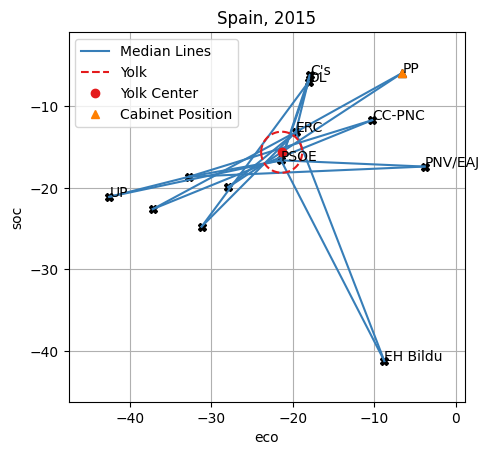

In [84]:
# parliament = new_parliament_bib[109]
parliament = minority_cabs[150]

eco = parliament["member"]["stance_eco"]
soc = parliament["member"]["stance_soc"]

eco_cabinet = parliament["cabinet"]["stance_eco"]
soc_cabinet = parliament["cabinet"]["stance_soc"]

eco_soc_cabinet = (np.mean(eco_cabinet), np.mean(soc_cabinet))

eco_soc_mean = (np.mean(eco), np.mean(soc))
eco_soc_median = (np.median(eco), np.median(soc))

points = [(e,s) for e,s in zip(eco,soc)]

yolk_center, yolk_radius = calculate_yolk(points, accuracy=0.1)

plot = True
colorblind = False
if plot:
    if colorblind:
        median_color = "black"
        yolk_color = "black"
    else:
        median_color = CB_color_cycle[0]
        yolk_color = CB_color_cycle[7]

    points = list(dict.fromkeys(points)) # delete duplicate points 
    median_lines = get_median_lines(points, only_in_bounds=False)

    fig, ax = plt.subplots()

    for n, (e, s) in enumerate(zip(eco, soc)):
        party_id = parliament["member"]["manifesto_id"][n]
        if party_id in parliament["cabinet"]["manifesto_id"]:
            marker = "^"
        else:
            marker = "X"
        ax.plot(e, s, marker, color="black")
        ax.annotate(parliament["member"]["name"][n], (e,s))
    
    for n, m in enumerate(median_lines):
        x, y = transform_points(*m)
        if n == len(median_lines)-1:
            ax.plot(x, y, color=median_color, label="Median Lines")
        else:
            ax.plot(x, y, color=median_color)

    if yolk_radius != 100000:
        x, y = circle(yolk_center, yolk_radius)
        ax.plot(x,y, label="Yolk", color=yolk_color, linestyle="dashed")

    if len(yolk_center) != 0:
        ax.plot(yolk_center[0], yolk_center[1], "o", color=yolk_color, label="Yolk Center")

    ax.plot(eco_soc_cabinet[0], eco_soc_cabinet[1], "^", color=CB_color_cycle[1], label="Cabinet Position")

    # ax.plot(eco_soc_mean[0], eco_soc_mean[1], "X", color="green", label="eco soc mean")
    # ax.plot(eco_soc_median[0], eco_soc_median[1], "X", color="violet", label="eco soc median")

    ax.set_xlabel("eco")
    ax.set_ylabel("soc")

    x, y = zip(*points)
    min_x, max_x = min(x), max(x)
    min_y, max_y = min(y), max(y)

    ax.set_xlim(min_x-5,max_x+5)
    ax.set_ylim(min_y-5,max_y+5)

    ax.legend(loc="best")

    ax.set_title(f"{parliament["country"]}, {parliament["election_date"].year}")
    ax.grid()
    ax.set_aspect("equal")
    plt.show()